<a href="https://colab.research.google.com/github/BosieAkUSD/visionnet-human-detection/blob/main/RO_updated_dataset_ComputerVision_FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import matplotlib.pyplot as plt
import random
import cv2

In [ ]:
#connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')
!ls 'drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated'

Mounted at /content/drive
0  1


In [ ]:
cd 'drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated'

/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated


Checking folder: /content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/0
Number of image files in 0: 556
Checking folder: /content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/1
Number of image files in 1: 558


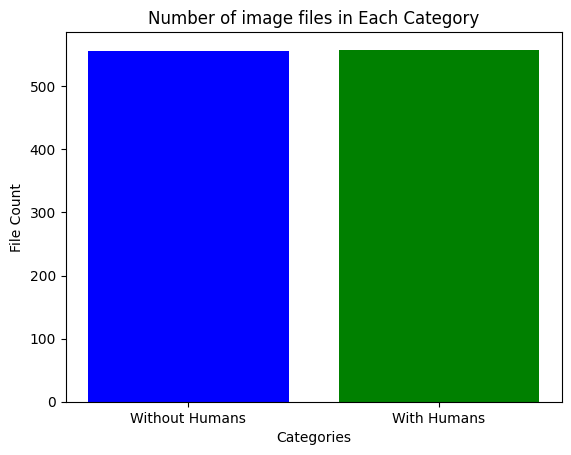

In [ ]:
# Plot number of images per category. [0] = no humans , [1] with human
# Base path
base_path = "/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated"
directories = ["0", "1"]
# Custom labels for directories
labels = {
    "0": "Without Humans",
    "1": "With Humans"
}

# Count .jpg or png files
file_counts = {}
for folder in directories:
    folder_path = os.path.join(base_path, folder)
    print(f"Checking folder: {folder_path}")
    if os.path.exists(folder_path):
        jpg_count = len([f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg'))])
        file_counts[folder] = jpg_count
        print(f"Number of image files in {folder}: {jpg_count}")
    else:
        print(f"Folder {folder_path} does not exist!")
        file_counts[folder] = 0

# Replace keys with custom labels for plotting
plot_labels = [labels[key] for key in file_counts.keys()]

# Plot the counts
plt.bar(plot_labels, file_counts.values(), color=['blue', 'green'])
plt.title("Number of image files in Each Category")
plt.xlabel("Categories")
plt.ylabel("File Count")
plt.show()


In [ ]:
#This part is done, now there is a balanced dataset - no need to run again.
# Augment minority class [0]
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from tensorflow.keras.utils import img_to_array, load_img

# Paths for each class
class_0_path = "/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/0"
class_1_path = "/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/1"
# Create an ImageDataGenerator for augmentation
datagen = ImageDataGenerator(rotation_range=30,
                             width_shift_range=0.1,
                             height_shift_range=0.1,
                             shear_range=0.2,
                             zoom_range=0.2,
                             horizontal_flip=True,
                             fill_mode='nearest')

# Augment images from class `0`
num_to_add = 558 - 363
all_images = os.listdir(class_0_path)
random.seed(123)  # For reproducibility
for i in range(num_to_add):
    img_name = random.choice(all_images)
    img = load_img(os.path.join(class_0_path, img_name))  # Load image
    img_array = img_to_array(img)  # Convert to array
    img_array = img_array.reshape((1,) + img_array.shape)  # Reshape for generator

    # Generate an augmented image
    for batch in datagen.flow(img_array, batch_size=1, save_to_dir=class_0_path,
                              save_prefix="aug", save_format="png"):
        break  # Save one image per iteration

print(f"Augmented class 0 to match class 1. New total: {len(os.listdir(class_0_path))}")



Augmented class 0 to match class 1. New total: 556


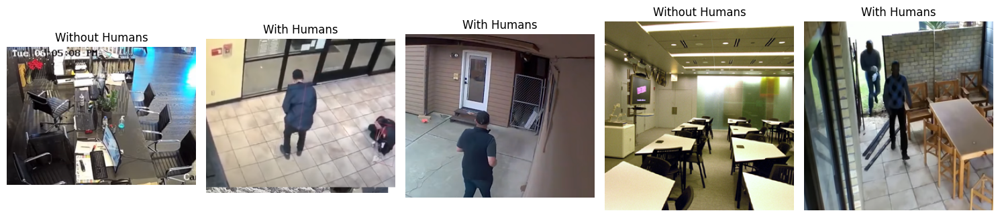

In [ ]:
import random
from matplotlib.image import imread
# Collect all image paths with their labels
image_paths = []
for label in directories:
    folder_path = os.path.join(base_path, label)
    images = [os.path.join(folder_path, img) for img in os.listdir(folder_path) if img.lower().endswith(('.png'))]
    image_paths.extend([(img_path, labels[label]) for img_path in images])

# Select 5 random images
random_images = random.sample(image_paths, 5)

# Plot the images with labels
plt.figure(figsize=(15, 10))
for i, (img_path, label) in enumerate(random_images, start=1):
    img = imread(img_path)
    plt.subplot(1, 5, i)
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import image_dataset_from_directory
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.python.keras.utils import tf_utils

In [ ]:
# Directory with dataset
data_dir = "/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated"

# Parameters
batch_size = 16
img_size = (224, 224)

# Load dataset with file paths
train_dataset = image_dataset_from_directory(
    data_dir,
    labels="inferred",
    label_mode="int",
    batch_size=batch_size,
    image_size=img_size,
    shuffle=True,
    validation_split=0.2,  # 20% for validation/test split
    subset="training",
    seed=123,
)

val_dataset = image_dataset_from_directory(
    data_dir,
    labels="inferred",
    label_mode="int",
    batch_size=batch_size,
    image_size=img_size,
    shuffle=True,
    validation_split=0.2,
    subset="validation",
    seed=123,
)

# Get file paths directly from the dataset
train_file_paths = train_dataset.file_paths  # List of file paths for the training set
val_file_paths = val_dataset.file_paths  # List of file paths for the validation set

# Attach file paths to the dataset
train_dataset_with_paths = train_dataset.map(
    lambda x, y: (x, y, tf.constant(train_file_paths))
)
val_dataset_with_paths = val_dataset.map(
    lambda x, y: (x, y, tf.constant(val_file_paths))
)

# Display sample file paths and labels
for images, labels, paths in train_dataset_with_paths.take(1):
    print("Sample File Paths:", paths.numpy()[:5])  # Show first 5 file paths
    print("Sample Labels:", labels.numpy()[:5])    # Show corresponding labels

Found 1114 files belonging to 2 classes.
Using 892 files for training.
Found 1114 files belonging to 2 classes.
Using 222 files for validation.
Sample File Paths: [b'/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/0/aug_0_2116.png'
 b'/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/0/252.png'
 b'/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/0/aug_0_1460.png'
 b'/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/1/225.png'
 b'/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated/1/253.png']
Sample Labels: [0 1 1 1 1]


In [ ]:
train_dataset = train_dataset_with_paths
val_dataset = val_dataset_with_paths

In [ ]:
# Create a test dataset from the validation dataset
val_batches = tf.data.experimental.cardinality(val_dataset)
test_dataset = val_dataset.take(val_batches // 2)  # Half of validation for testing
val_dataset = val_dataset.skip(val_batches // 2)  # Remaining half for validation

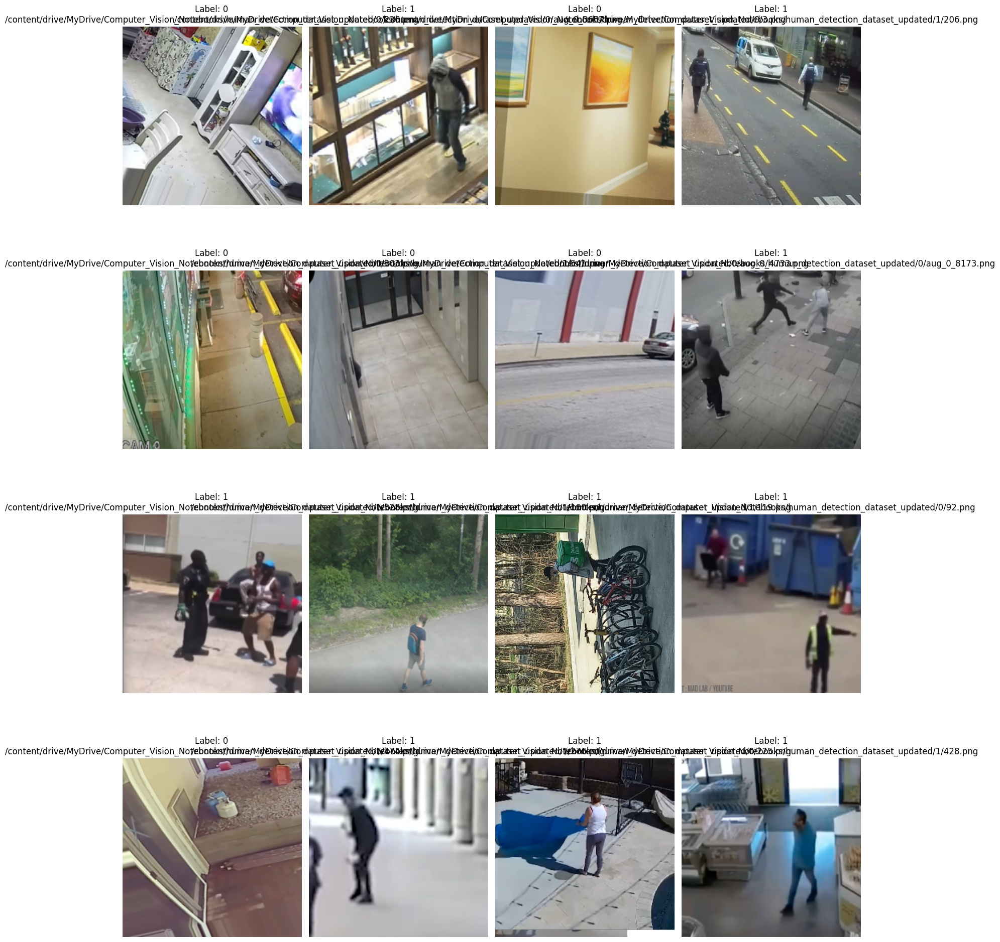

In [ ]:
# Print test dataset for visualization purposes
import matplotlib.pyplot as plt

# Display images, labels, and file paths from the test dataset
for batch in test_dataset.take(1):  # Process one batch for demonstration
    images, labels, file_paths = batch  # Unpack images, labels, and file paths

    num_images = len(images)
    rows = (num_images + 3) // 4  # Calculate number of rows (4 images per row)
    fig, axes = plt.subplots(rows, 4, figsize=(15, 5 * rows))  # Adjust figure size based on rows

    for i, ax in enumerate(axes.flat):  # Flatten the grid for easy iteration
        if i < num_images:
            ax.imshow(images[i].numpy().astype("uint8"))  # Convert to a displayable format
            ax.set_title(f"Label: {labels[i].numpy()}\n{file_paths[i].numpy().decode()}")
            ax.axis("off")  # Turn off axes
        else:
            ax.axis("off")  # Turn off unused subplots

    plt.tight_layout()
    plt.show()


In [ ]:

# Count the number of batches and images in the test dataset
num_batches = tf.data.experimental.cardinality(test_dataset).numpy()
num_images = num_batches * batch_size

print(f"The test dataset contains {num_images} images.")

The test dataset contains 112 images.


In [ ]:
# Normalize pixel values
normalization_layer = tf.keras.layers.Rescaling(1./255)
train_dataset = train_dataset.map(lambda x, y, z: (normalization_layer(x), y, z))  # Include 'z' for file path
val_dataset = val_dataset.map(lambda x, y, z: (normalization_layer(x), y, z))  # Include 'z' for file path
test_dataset = test_dataset.map(lambda x, y, z: (normalization_layer(x), y, z))  # Include 'z' for file path


# Use prefetching to improve performance
AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)


In [ ]:

# Build the VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Add custom layers
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)  # Increase units
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)  # Additional dense layer
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

# Create the model
model = Model(inputs=base_model.input, outputs=output)

loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-6),
    loss=loss,
    metrics=['accuracy']
)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
#Optimized Model Definition
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Dense,
    Dropout,
    BatchNormalization,
)
from tensorflow.keras.regularizers import l2

# Build the VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Unfreeze the last few layers
base_model.trainable = True
for layer in base_model.layers[:-4]:
    layer.trainable = False

# Add custom layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)  # Binary classification

# Create the model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-6)
loss = tf.keras.losses.BinaryCrossentropy()
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

# Display model summary
model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │          65,6

 Total params: 14,780,993 (56.39 MB)

 Trainable params: 7,145,473 (27.26 MB)

 Non-trainable params: 7,635,520 (29.13 MB)

In [ ]:
# Train the model
history = model.fit(
    train_dataset.map(lambda x, y, z: (x, y)),  # I'm ommiting the filename path, this is only needed for troubleshooting not training
    validation_data=val_dataset.map(lambda x, y, z: (x, y)),  # Only include images (x) and labels (y)
    epochs=30
)


Epoch 1/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - accuracy: 0.5698 - loss: 2.8593 - val_accuracy: 0.6545 - val_loss: 2.6927
Epoch 2/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6537 - loss: 2.7165 - val_accuracy: 0.7000 - val_loss: 2.6757
Epoch 3/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6789 - loss: 2.6807 - val_accuracy: 0.7273 - val_loss: 2.6491
Epoch 4/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.6957 - loss: 2.5953 - val_accuracy: 0.7091 - val_loss: 2.6207
Epoch 5/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7431 - loss: 2.5800 - val_accuracy: 0.7909 - val_loss: 2.5666
Epoch 6/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.7258 - loss: 2.5437 - val_accuracy: 0.7545 - val_loss: 2.5397
Epoch 7/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7379 - loss: 2.5503 - val_accuracy: 0.8091 - val_loss: 2.4535
Epoch 8/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7681 - loss: 2.5031 - val_accuracy: 0.8273 - v

In [ ]:
model.save('/content/drive/MyDrive/Computer_Vision_Notebooks/optmized_VGG16_model.keras')

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model('/content/drive/MyDrive/Computer_Vision_Notebooks/optmized_VGG16_model.keras')

# Display the model's architecture (optional)
model.summary()

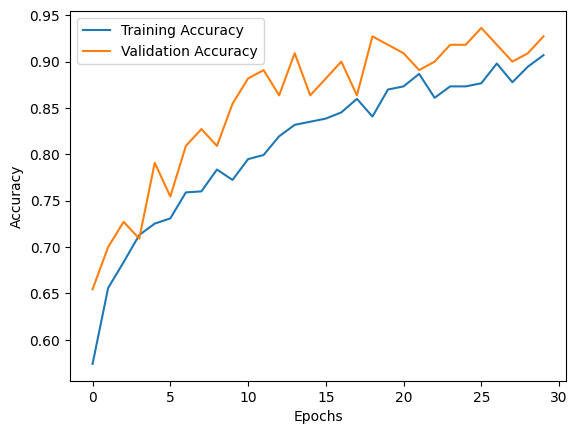

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9026 - loss: 2.2750
Test Accuracy: 0.92
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


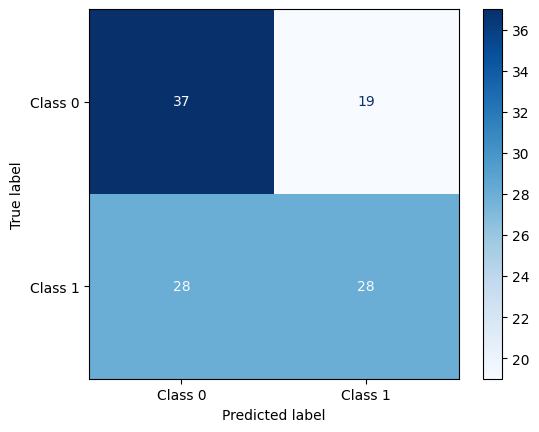

              precision    recall  f1-score   support

     Class 0       0.57      0.66      0.61        56
     Class 1       0.60      0.50      0.54        56

    accuracy                           0.58       112
   macro avg       0.58      0.58      0.58       112
weighted avg       0.58      0.58      0.58       112



In [ ]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_dataset.map(lambda x, y, z: (x, y)))  # Map test_dataset similar to train/val datasets
print(f"Test Accuracy: {test_accuracy:.2f}")

# Generate predictions and compute the confusion matrix
y_true = np.concatenate([y.numpy() for _, y, _ in test_dataset], axis=0)  # Include the ignored '_' for filename paths
y_pred = (model.predict(test_dataset.map(lambda x, y, z: x)) > 0.5).astype(int).flatten()  # Only provide images to predict

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Class 0", "Class 1"])
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Classification report
print(classification_report(y_true, y_pred, target_names=["Class 0", "Class 1"]))

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Total Misclassified Images: 61


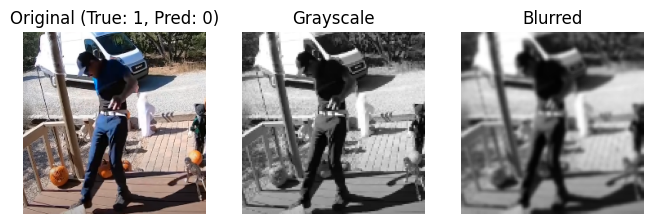

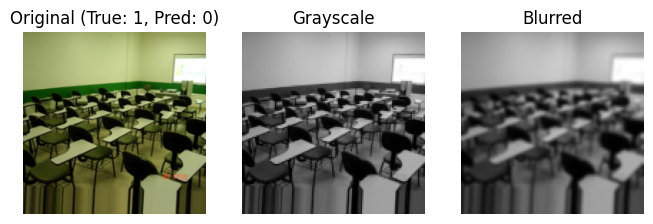

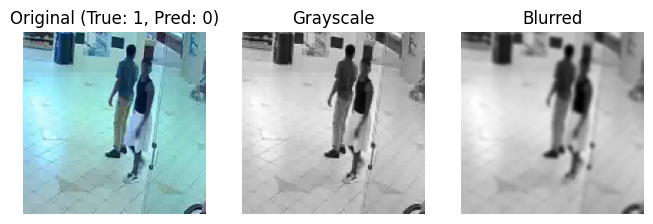

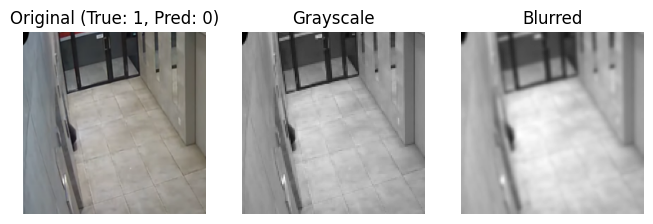

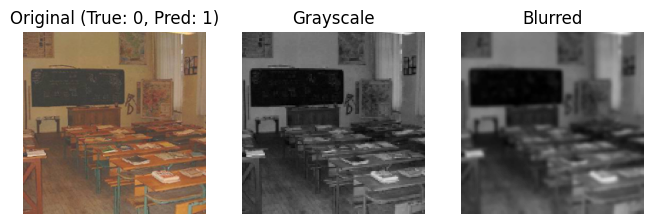

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Get true labels and predictions
y_true = np.concatenate([y.numpy() for _, y, _ in test_dataset], axis=0)
y_pred = (model.predict(test_dataset.map(lambda x, y, z: x)) > 0.5).astype(int).flatten() # Providing only images to predict

# Find misclassified indices
misclassified_indices = np.where(y_true != y_pred)[0]

# If there are misclassified images, process and display them
if len(misclassified_indices) > 0:
    print(f"Total Misclassified Images: {len(misclassified_indices)}")

    for i, idx in enumerate(misclassified_indices[:5]):  # Show up to 5 misclassified images
        for batch in test_dataset:
            images, labels, _ = batch  # Unpack images, labels, and ignore file paths
            if idx < len(images):
                img = images[idx].numpy()  # Convert tensor to NumPy array
                true_label = y_true[idx]
                pred_label = y_pred[idx]
                break
            idx -= len(images)

        # Convert image from RGB to BGR (OpenCV uses BGR format)
        img_bgr = cv2.cvtColor((img * 255).astype('uint8'), cv2.COLOR_RGB2BGR)

        # Example OpenCV operations:
        # 1. Resize the image
        resized_img = cv2.resize(img_bgr, (128, 128))

        # 2. Convert to grayscale
        gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)

        # 3. Apply Gaussian blur
        blurred_img = cv2.GaussianBlur(gray_img, (5, 5), 0)

        # Display original and processed images
        plt.figure(figsize=(8, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))  # Convert back to RGB for display
        plt.title(f"Original (True: {true_label}, Pred: {pred_label})")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(gray_img, cmap='gray')
        plt.title("Grayscale")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(blurred_img, cmap='gray')
        plt.title("Blurred")
        plt.axis('off')

        plt.show()
else:
    print("No misclassified images found!")

Real Label for Misclassified Image: 1


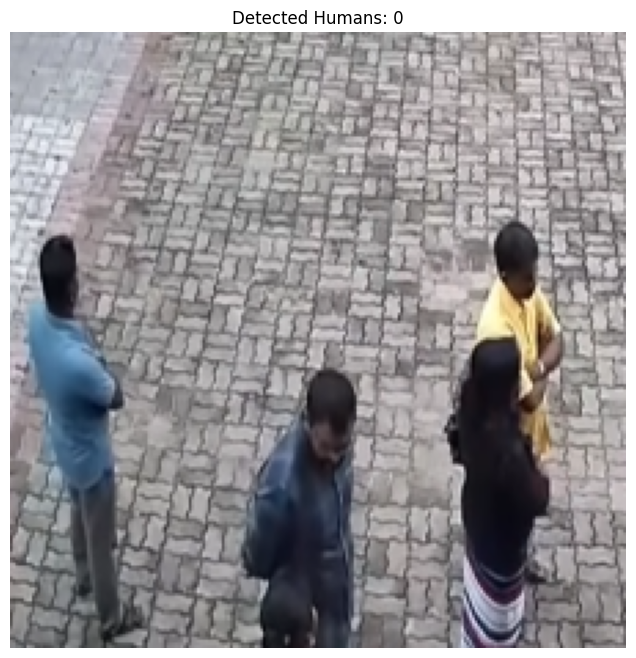

Real Label for Misclassified Image: 1


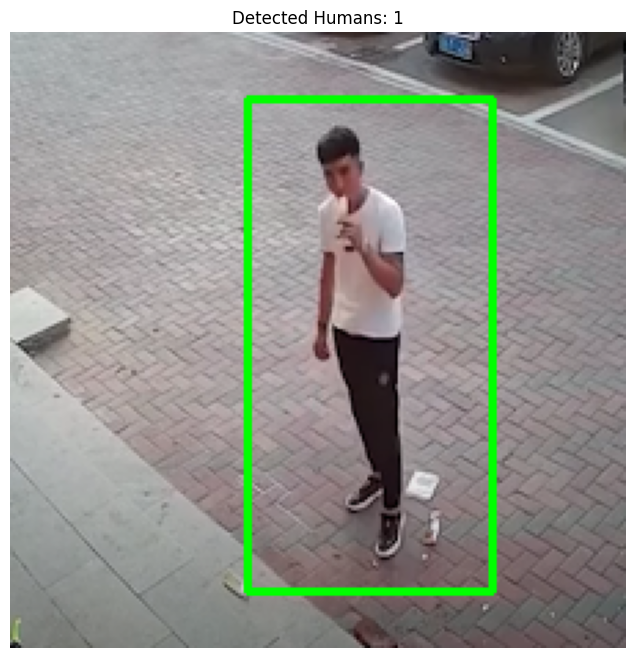

In [ ]:
# Initialize the HOG descriptor/person detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

def detect_and_display(image):
    # Convert image to BGR (if needed) for OpenCV operations
    image_bgr = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_RGB2BGR)

    # Detect humans in the image
    (rects, weights) = hog.detectMultiScale(image_bgr,
                                            winStride=(4, 4),
                                            padding=(8, 8),
                                            scale=1.05)

    # Draw bounding boxes for detected humans
    for (x, y, w, h) in rects:
        cv2.rectangle(image_bgr, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert the image back to RGB for displaying with Matplotlib
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(image_rgb)
    plt.title(f"Detected Humans: {len(rects)}")
    plt.axis('off')
    plt.show()

# Example: Test the function on a misclassified image
for i, idx in enumerate(misclassified_indices[:1]):  # Using one image for demonstration
    for batch_index, batch in enumerate(test_dataset):
        # Unpack the three values from the batch: images, labels, and paths
        images, labels, _ = batch  # _ is used to ignore the file paths in this loop
        if idx < len(images):
            img = images[idx].numpy()  # Convert tensor to NumPy array

            # Retrieve the real label
            real_label = labels[idx].numpy()
            print(f"Real Label for Misclassified Image: {real_label}")

            # Detect and display humans
            detect_and_display(img)
            break
        idx -= len(images)

# Test the function and print real labels for misclassified images
for i, idx in enumerate(misclassified_indices[:1]):  # Using one image for demonstration
    for batch_index, batch in enumerate(test_dataset):
        images, labels, _ = batch
        if idx < len(images):
            img = images[idx].numpy()  # Convert tensor to NumPy array

            # Retrieve the real label
            real_label = labels[idx].numpy()
            print(f"Real Label for Misclassified Image: {real_label}")

            # Detect and display humans
            detect_and_display(img)
            break
        idx -= len(images)

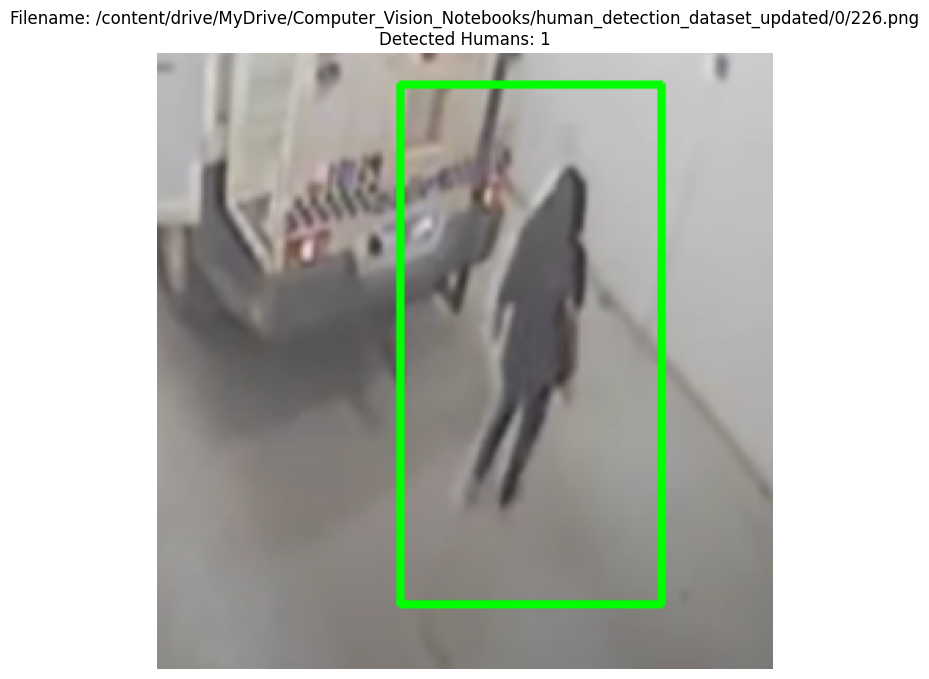

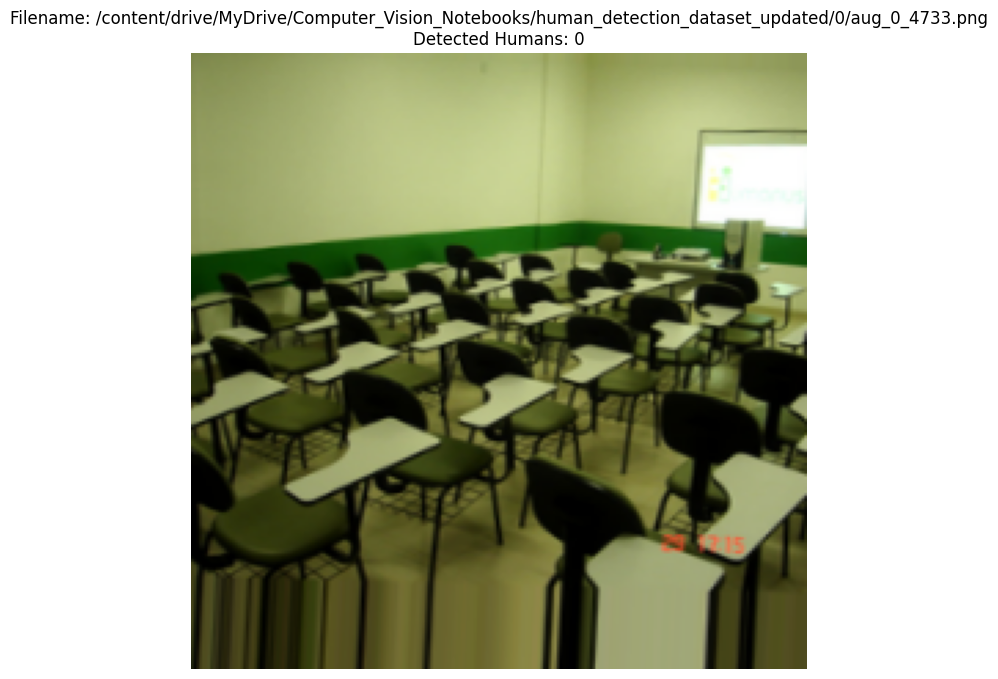

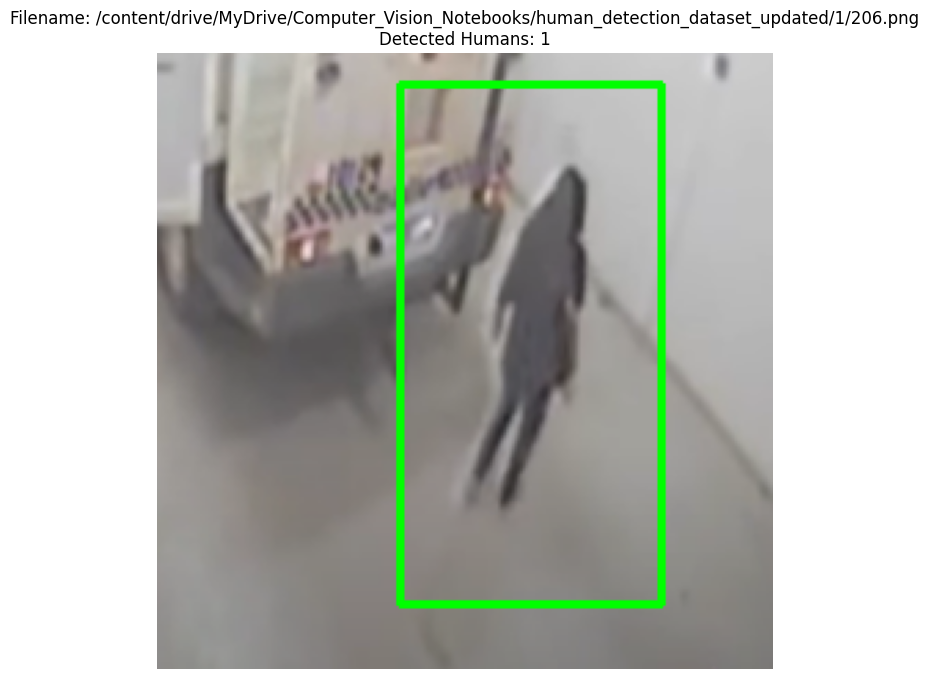

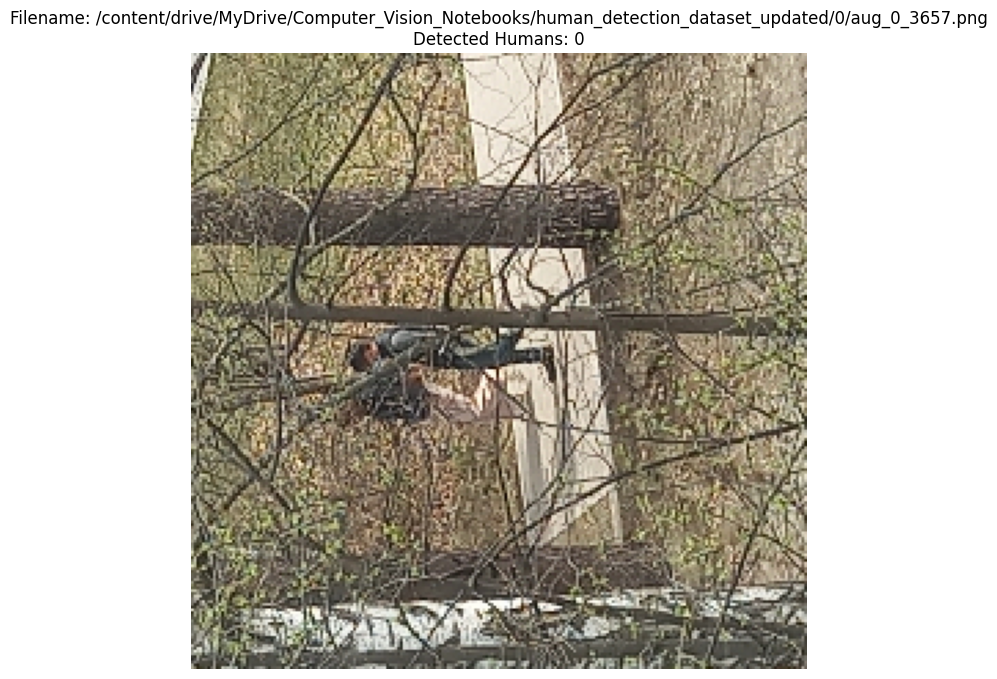

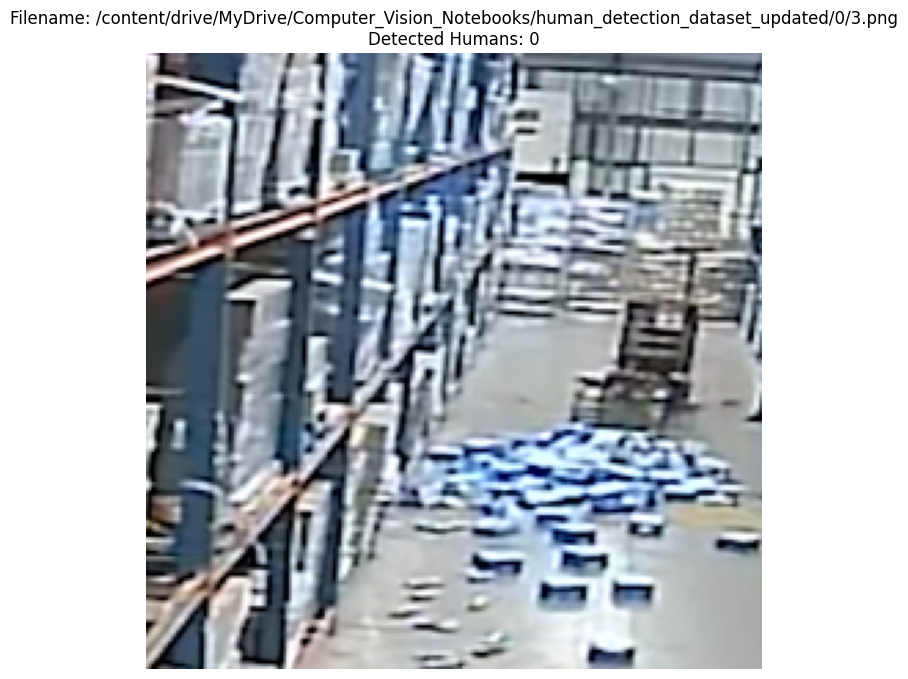

In [ ]:
# Initialize the HOG descriptor/person detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

def detect_and_display(image, filename):
    # Convert image to BGR (if needed) for OpenCV operations
    image_bgr = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_RGB2BGR)

    # Detect humans in the image
    (rects, weights) = hog.detectMultiScale(image_bgr,
                                            winStride=(4, 4),
                                            padding=(8, 8),
                                            scale=1.05)

    # Draw bounding boxes for detected humans
    for (x, y, w, h) in rects:
        cv2.rectangle(image_bgr, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert the image back to RGB for displaying with Matplotlib
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Display the image with filename
    plt.figure(figsize=(8, 8))
    plt.imshow(image_rgb)
    plt.title(f"Filename: {filename}\nDetected Humans: {len(rects)}")
    plt.axis('off')
    plt.show()

# Randomly select 5 images from the test dataset
random_indices = random.sample(range(len(test_dataset)), 5)

# Display the selected random images along with filenames
for random_index in random_indices:
    for batch_index, batch in enumerate(test_dataset):
        # Unpack the batch: images, labels, and file paths
        images, labels, file_paths = batch

        if random_index < len(images):
            img = images[random_index].numpy()  # Convert tensor to NumPy array
            filename = file_paths[random_index].numpy().decode()  # Decode file path

            # Detect and display humans in the random image
            detect_and_display(img, filename)
            break

        random_index -= len(images)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
Prediction confidence: [0.02512442]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction confidence: [0.2405598]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction confidence: [0.85875267]


<ipython-input-38-b9d41da05b29>:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return int(prediction[0] > 0.5)  # Classify as 1 if confidence > 0.04


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Prediction confidence: [0.5368536]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction confidence: [0.9905737]


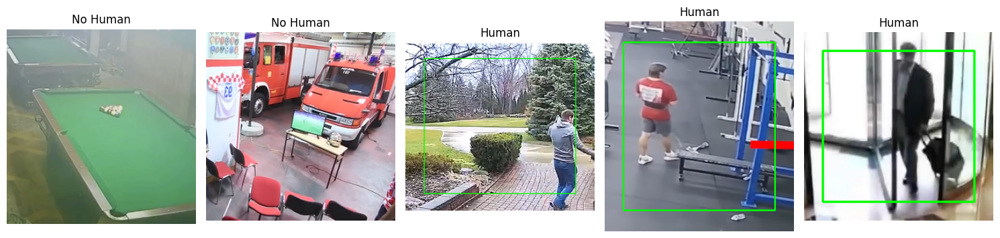

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import os
import random
import matplotlib.pyplot as plt

# Load the pre-trained VGG16 model (assuming the model is saved as 'model')
# Replace 'model_path' with the path to your saved model file
model_path = "/content/drive/MyDrive/Computer_Vision_Notebooks/optmized_VGG16_model.keras"
model = tf.keras.models.load_model(model_path)

# Function to preprocess image for the model
def preprocess_image(image_path, target_size=(224, 224)):
    """
    Preprocesses an image for the VGG16 model.
    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing (default: (224, 224)).
    Returns:
        numpy array: Preprocessed image.
    """
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, target_size)         # Resize to target size
    image = image / 255.0                          # Normalize pixel values
    image = np.expand_dims(image, axis=0)          # Add batch dimension
    return image

# Function to classify an image as human (1) or no human (0)
def detect_human(image_path):
    """
    Detects whether an image contains a human.
    Args:
        image_path (str): Path to the image file.
    Returns:
        int: 1 if human is detected, 0 otherwise.
    """
    image = preprocess_image(image_path)
    prediction = model.predict(image)
    print(f"Prediction confidence: {prediction[0]}")
    return int(prediction[0] > 0.5)  # Classify as 1 if confidence > 0.04

# Function to process and plot 5 random images with bounding box for human detection
def process_and_plot_with_boxes(dataset_path, num_images=5):
    """
    Processes random images, classifies them, and draws a square for human detection.
    Args:
        dataset_path (str): Path to the dataset folder.
        num_images (int): Number of random images to process (default: 5).
    """
    # Gather all image paths from the two folders (0 and 1)
    all_image_paths = []
    for folder in ['0', '1']:
        folder_path = os.path.join(dataset_path, folder)

        # Check if the folder exists before trying to access it
        if os.path.exists(folder_path):
            all_image_paths += [
                os.path.join(folder_path, file)
                for file in os.listdir(folder_path)
                if file.endswith('.png')
            ]
        else:
            print(f"Warning: Folder '{folder_path}' not found. Skipping...")

    # Select random images
    random_images = random.sample(all_image_paths, num_images)

    # Plot images with bounding box if human is detected
    plt.figure(figsize=(15, 5))
    for i, image_path in enumerate(random_images):
        # Read the image
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # For display

        # Classify the image
        classification = detect_human(image_path)
        label = "Human" if classification == 1 else "No Human"

        # If human is detected, draw a bounding box
        if classification == 1:
            height, width, _ = image.shape
            start_point = (int(width * 0.1), int(height * 0.1))  # Top-left corner
            end_point = (int(width * 0.9), int(height * 0.9))    # Bottom-right corner
            color = (0, 255, 0)  # Green box
            thickness = 2
            image_rgb = cv2.rectangle(image_rgb, start_point, end_point, color, thickness)

        # Plot the image
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image_rgb)
        plt.title(label)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Path to the dataset
dataset_path = '/content/drive/MyDrive/Computer_Vision_Notebooks/human_detection_dataset_updated'

# Process and plot 5 random images with bounding boxes
process_and_plot_with_boxes(dataset_path)
